In [4]:
import os
os.listdir()


['CV Project',
 'Image-Colorization',
 'AI FOR ALL ',
 '.ipynb_checkpoints',
 'Omama']

In [1]:
import os, sys
sys.path.append(os.getcwd())  # Add current folder to Python path


In [2]:
from unetmodel import build_unet


2025-05-18 23:25:14.751913: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747625114.773981  703221 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747625114.779403  703221 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747625114.792801  703221 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1747625114.792830  703221 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1747625114.792832  703221 computation_placer.cc:177] computation placer alr

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from unetmodel import build_unet  # assumes unetmodel.py is in same folder


In [4]:
# Paths
BASE_DIR = "/raid/mpsych/OMAMA/2025/PLAYGROUND/cancer_classifier_1024"
IMG_DIR = os.path.join(BASE_DIR, "split/test/images")
MASK_DIR = os.path.join(BASE_DIR, "split/test/masks")
WEIGHT_PATH = os.path.join(BASE_DIR, "weights/best_model.h5")

# Load model
model = build_unet(input_shape=(1024, 1024, 1))
model.load_weights(WEIGHT_PATH)
model.summary()


I0000 00:00:1747625150.728753  703221 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38380 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:47:00.0, compute capability: 8.0


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 1024,      │          0 │ -                 │
│ (InputLayer)        │ 1024, 1)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 1024,      │        640 │ input_layer[0][0] │
│                     │ 1024, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 1024,      │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 1024, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 1024,      │          0 │ batch_normalizat… │
│ (Activation)        │ 1024, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 1024,      │     36,928 │ activation[0][0]  │
│                     │ 1024, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 1024,      │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 1024, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 1024,      │          0 │ batch_normalizat… │
│ (Activation)        │ 1024, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 512, 512,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 512, 512,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 512, 512,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 512, 512,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 512, 512,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 256, 256,  │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 256, 256,  │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │      1,024 │ conv2d_4[0][0]  

 Total params: 31,401,345 (119.79 MB)

 Trainable params: 31,389,569 (119.74 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [5]:
with open(os.path.join(BASE_DIR, "test_results_original.txt"), "r") as f:
    print(f.read())


100001062780186333300160449315992055513 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100002932790052970480170273042766799713 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100003452723749999699495719100088159102 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100004581092908878980242733221388780043 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100004975610322634394407525266807530675 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100011490461199519438625199003786308189 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100013138995339799737493828625310860573 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100015276965623657113217755604629109478 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100018248887900009551992472477002749064 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100019314764611309529007159832023977809 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100027349182213865810407877548225326338 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
100028639232462655881037603751335863955 | IoU: 1.0000 | Acc: 1.0000 | F1: 1.0000
1000297169547103521200651271

In [6]:
def visualize_prediction(image_id):
    img_path = os.path.join(IMG_DIR, image_id + ".npz")
    mask_path = os.path.join(MASK_DIR, image_id + ".png")

    # Load image
    img_npz = np.load(img_path)
    image = img_npz[img_npz.files[0]]
    image_norm = (image - np.min(image)) / (np.max(image) - np.min(image))
    image_input = np.expand_dims(image_norm, axis=(0, -1))  # Add batch and channel dims

    # Predict
    pred = model.predict(image_input)[0, :, :, 0]
    pred_bin = (pred > 0.5).astype(np.uint8)

    # Load ground truth mask
    gt = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    gt_bin = (gt > 127).astype(np.uint8)

    # Plot
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    axs[0].imshow(image, cmap='gray')
    axs[0].set_title(f"Original Image\nID: {image_id}")
    axs[0].axis("off")

    axs[1].imshow(gt_bin, cmap='gray')
    axs[1].set_title("Ground Truth Mask")
    axs[1].axis("off")

    axs[2].imshow(pred_bin, cmap='gray')
    axs[2].set_title("Predicted Mask")
    axs[2].axis("off")

    axs[3].imshow(image, cmap='gray')
    axs[3].imshow(pred_bin, cmap='jet', alpha=0.4)
    axs[3].set_title("Overlay: Prediction")
    axs[3].axis("off")

    plt.tight_layout()
    plt.show()



🔍 Visualizing image 1 / 30
📄 Image ID: 100001062780186333300160449315992055513
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


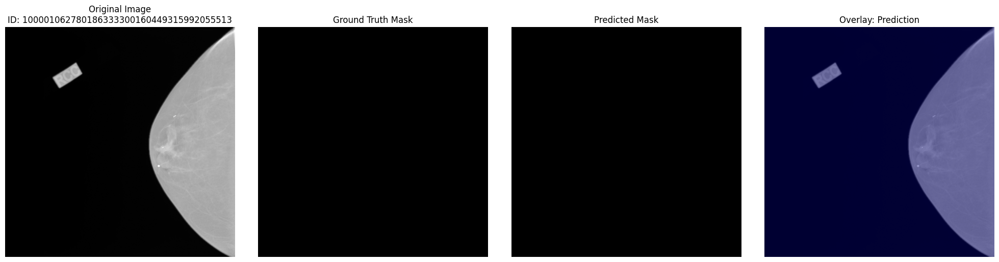


🔍 Visualizing image 2 / 30
📄 Image ID: 100002932790052970480170273042766799713
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


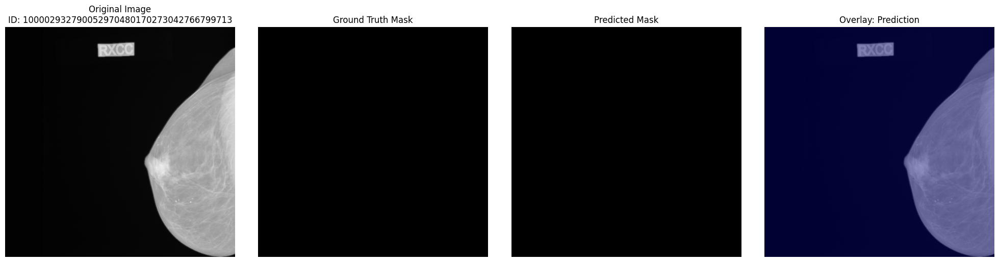


🔍 Visualizing image 3 / 30
📄 Image ID: 100003452723749999699495719100088159102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


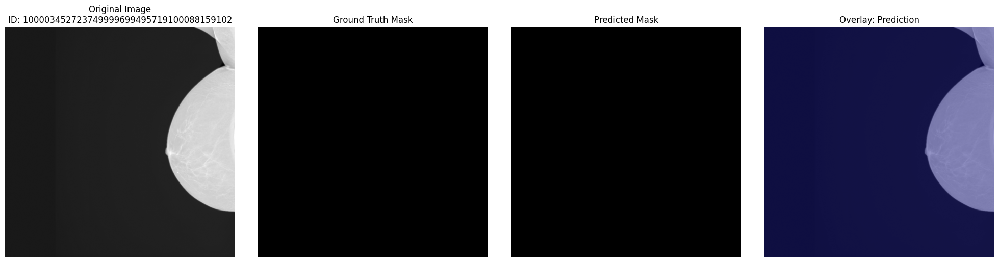


🔍 Visualizing image 4 / 30
📄 Image ID: 100004581092908878980242733221388780043
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


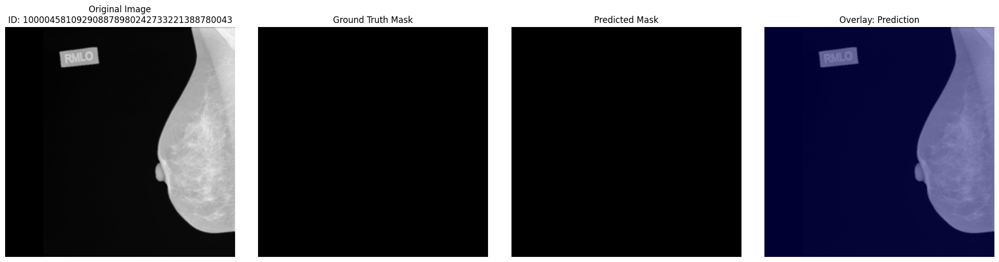


🔍 Visualizing image 5 / 30
📄 Image ID: 100004975610322634394407525266807530675
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


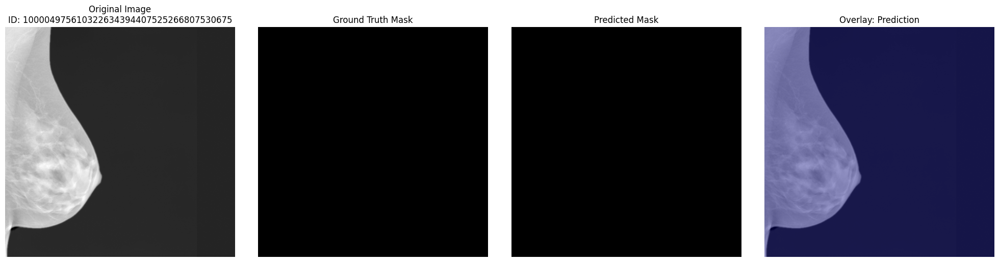


🔍 Visualizing image 6 / 30
📄 Image ID: 100011490461199519438625199003786308189
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


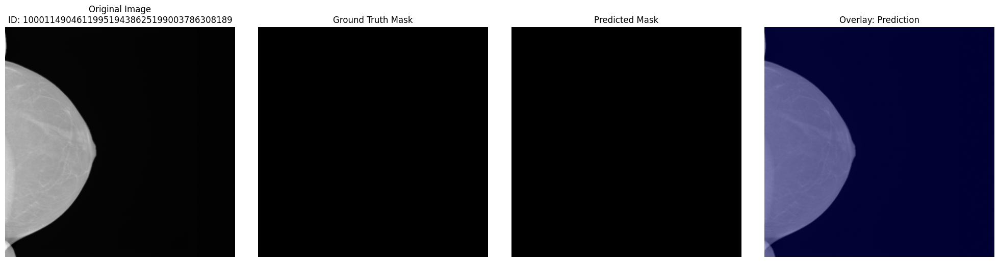


🔍 Visualizing image 7 / 30
📄 Image ID: 100013138995339799737493828625310860573
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


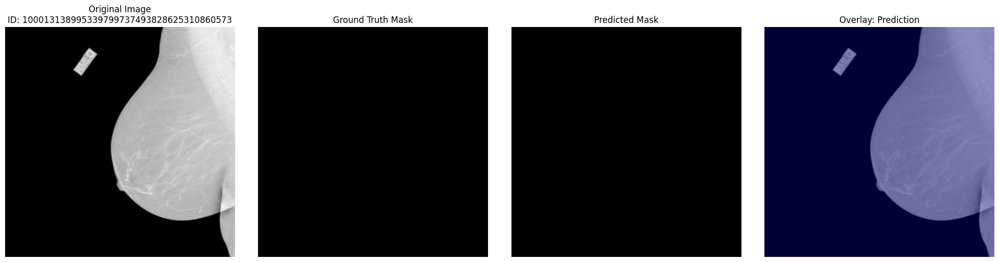


🔍 Visualizing image 8 / 30
📄 Image ID: 100015276965623657113217755604629109478
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


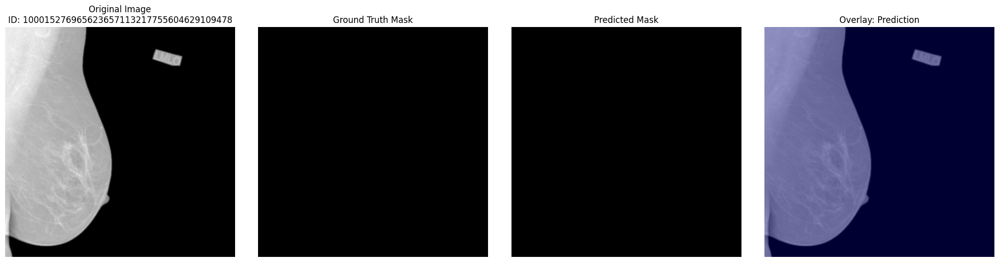


🔍 Visualizing image 9 / 30
📄 Image ID: 100018248887900009551992472477002749064
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


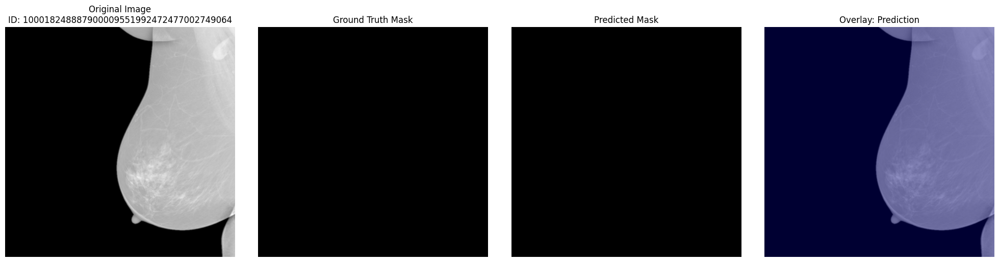


🔍 Visualizing image 10 / 30
📄 Image ID: 100019314764611309529007159832023977809
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


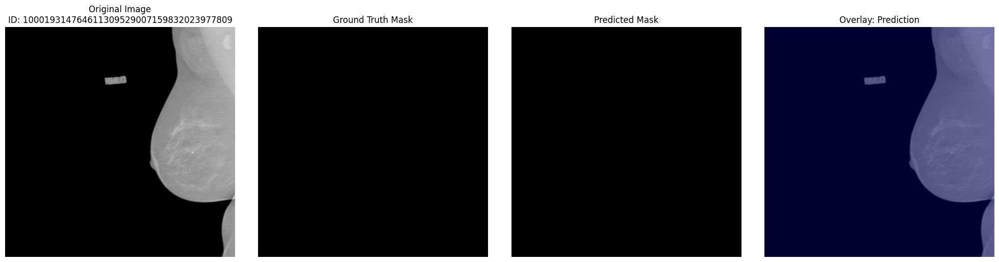


🔍 Visualizing image 11 / 30
📄 Image ID: 100027349182213865810407877548225326338
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


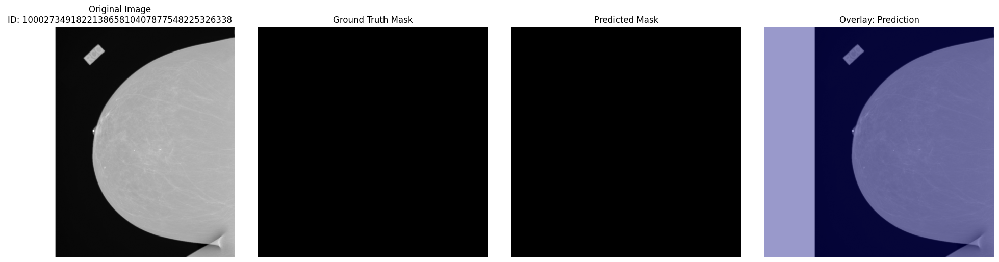


🔍 Visualizing image 12 / 30
📄 Image ID: 100028639232462655881037603751335863955
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


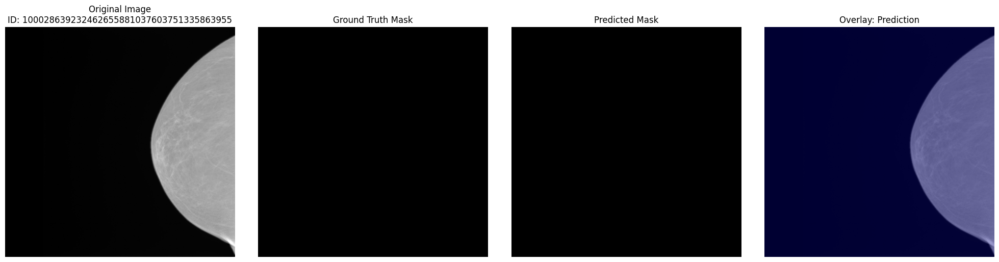


🔍 Visualizing image 13 / 30
📄 Image ID: 100029716954710352120065127133716041042
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


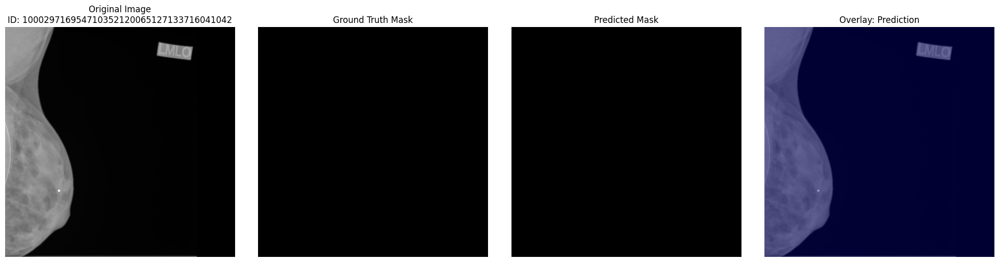


🔍 Visualizing image 14 / 30
📄 Image ID: 100036870647509933016762785490316684460
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


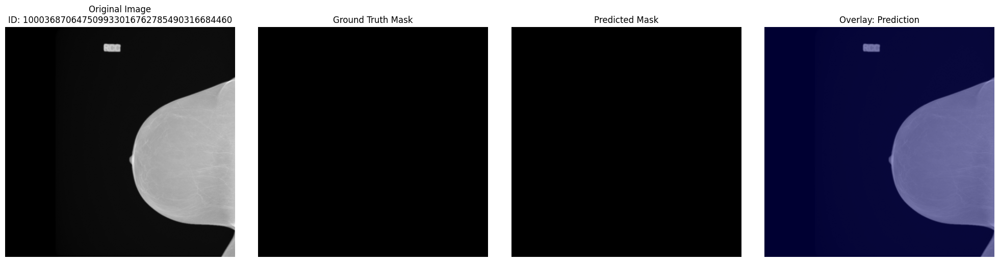


🔍 Visualizing image 15 / 30
📄 Image ID: 100037563083601073090407839383591218697
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


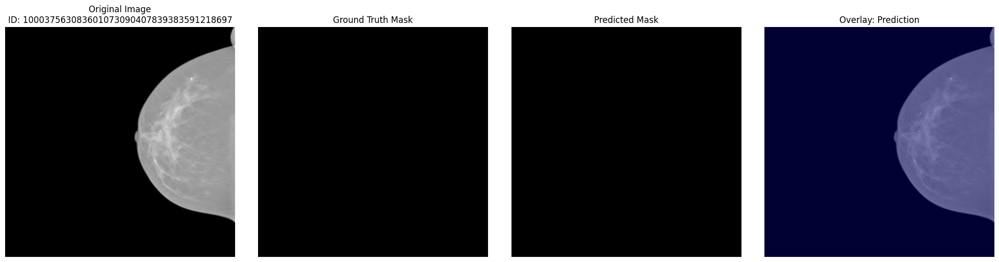


🔍 Visualizing image 16 / 30
📄 Image ID: 100039301254960711367666262228425304725
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


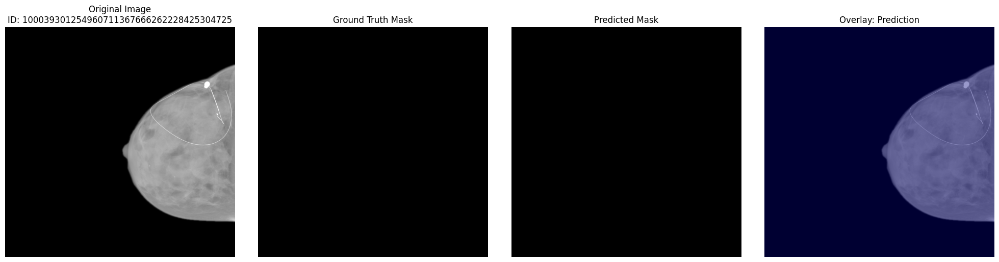


🔍 Visualizing image 17 / 30
📄 Image ID: 10004924461790101566773573946424623797
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


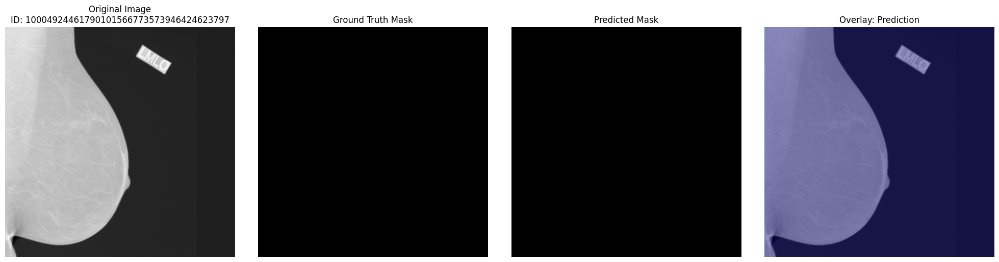


🔍 Visualizing image 18 / 30
📄 Image ID: 100054983368116122371206710897723271529
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


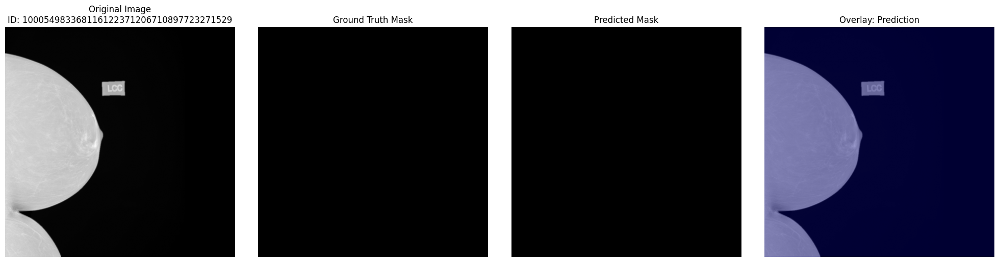


🔍 Visualizing image 19 / 30
📄 Image ID: 100055461737507294877441140337232141910
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


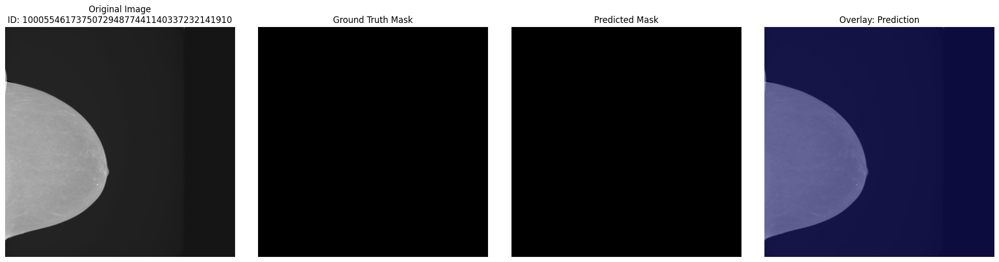


🔍 Visualizing image 20 / 30
📄 Image ID: 100057844836325183518153697628861012030
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


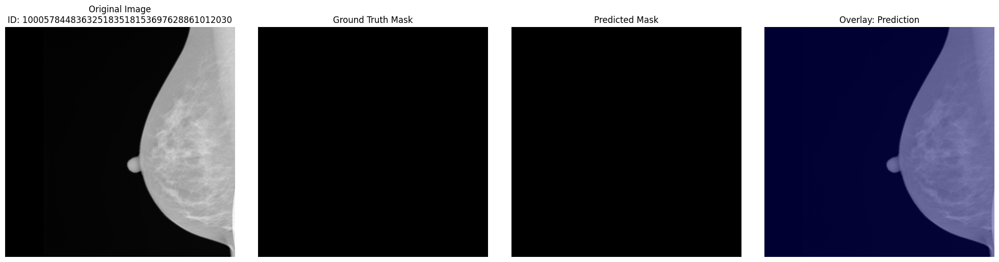


🔍 Visualizing image 21 / 30
📄 Image ID: 100061781815345996470204321080495941331
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


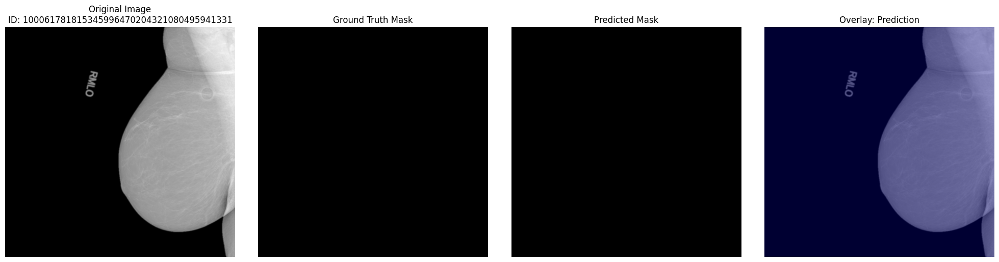


🔍 Visualizing image 22 / 30
📄 Image ID: 100061836789749783306557904860632071593
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


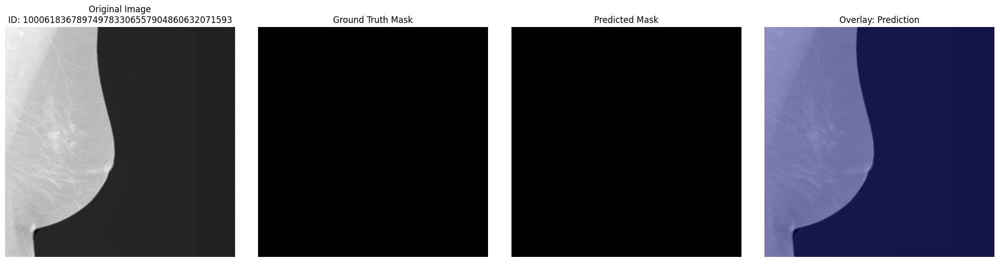


🔍 Visualizing image 23 / 30
📄 Image ID: 100062671057912613767475325223945534244
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


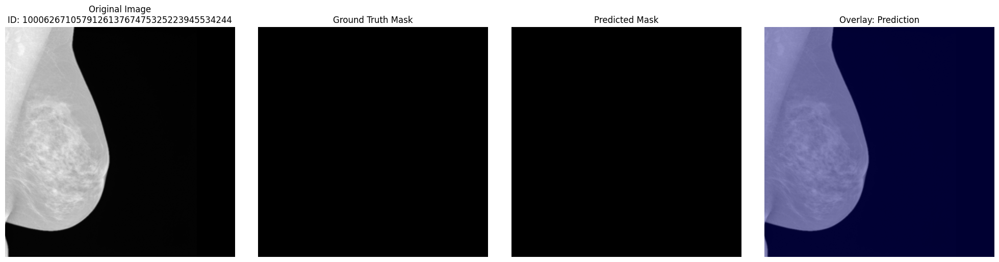


🔍 Visualizing image 24 / 30
📄 Image ID: 100063605606787746746895863548670891820
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


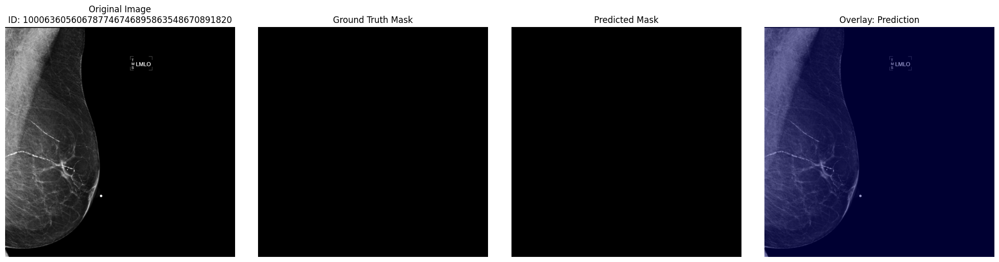


🔍 Visualizing image 25 / 30
📄 Image ID: 100064317252752468382314568266083658267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


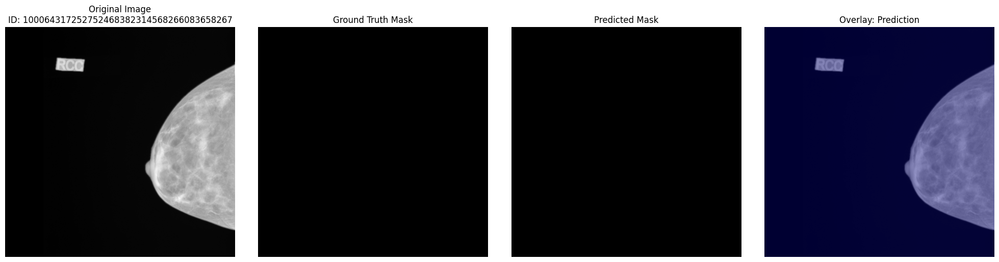


🔍 Visualizing image 26 / 30
📄 Image ID: 100065371214604060466328673305396270923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


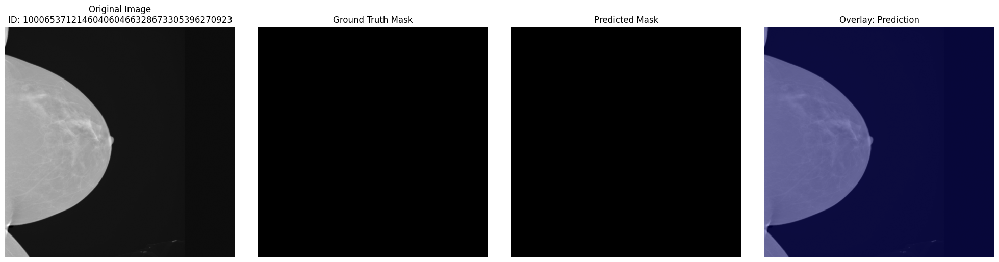


🔍 Visualizing image 27 / 30
📄 Image ID: 100065963129273709203902754315264090991
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


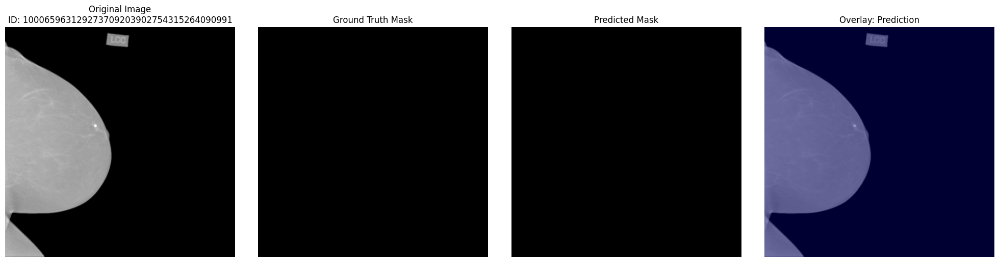


🔍 Visualizing image 28 / 30
📄 Image ID: 100067730086177392193038459060101437811
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


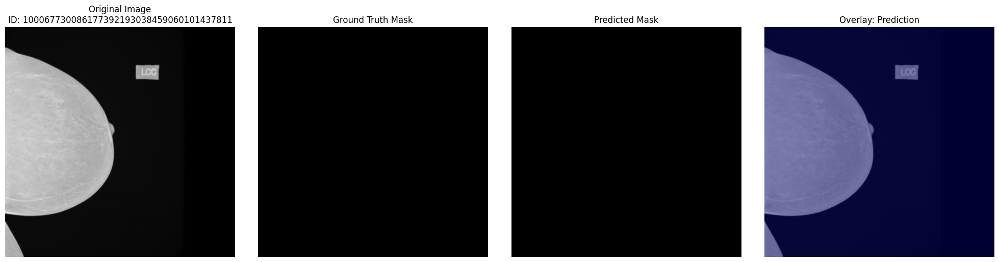


🔍 Visualizing image 29 / 30
📄 Image ID: 100070137072294840092201942994068930905
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


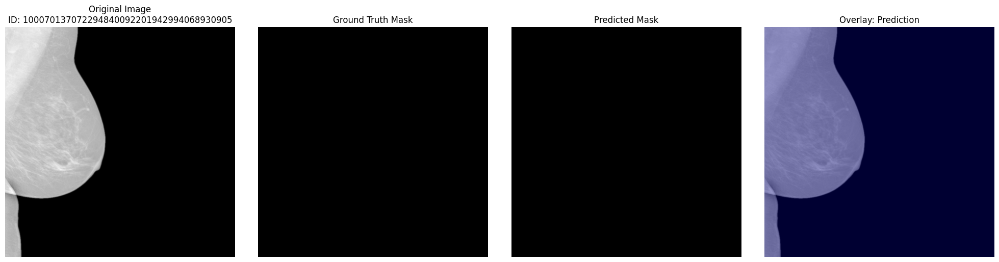


🔍 Visualizing image 30 / 30
📄 Image ID: 100070137598144934777437894058050492008
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


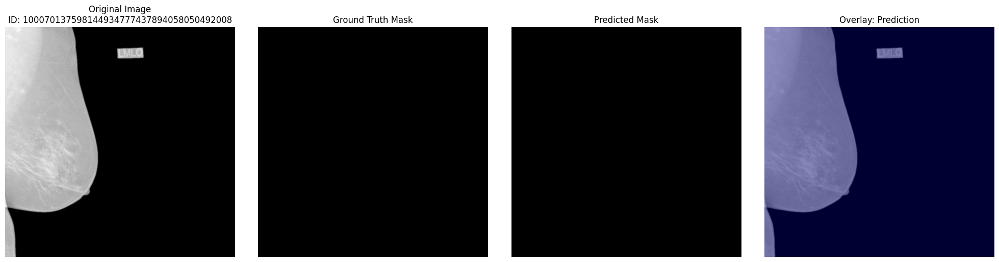

In [15]:
# List test image IDs
image_ids = sorted([f.replace(".npz", "") for f in os.listdir(IMG_DIR) if f.endswith(".npz")])

# Visualize the first 30 images
for i in range(30):
    print(f"\n🔍 Visualizing image {i+1} / 30")
    print(f"📄 Image ID: {image_ids[i]}")
    visualize_prediction(image_ids[i])


✅ Found 1493 cancer-positive images in the test set.

🔍 Visualizing cancer test image 1 / 1493
📄 Image ID: 92034001503803299981315968774194695820
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


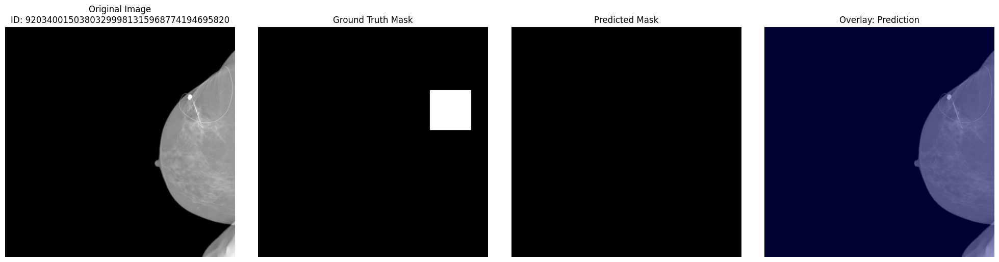


🔍 Visualizing cancer test image 2 / 1493
📄 Image ID: 294509528330375534031065434676646516951
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


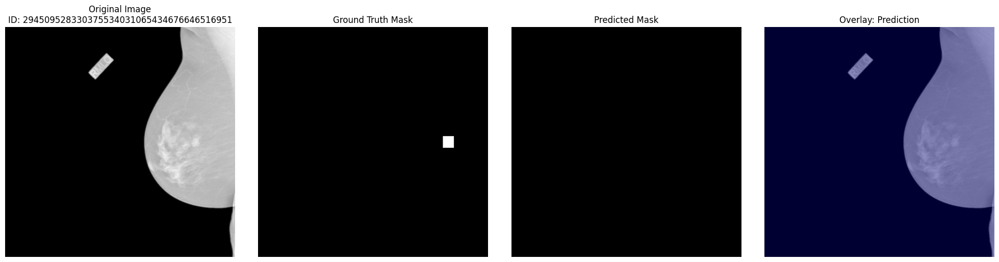


🔍 Visualizing cancer test image 3 / 1493
📄 Image ID: 34040183169417792413317219513112752651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


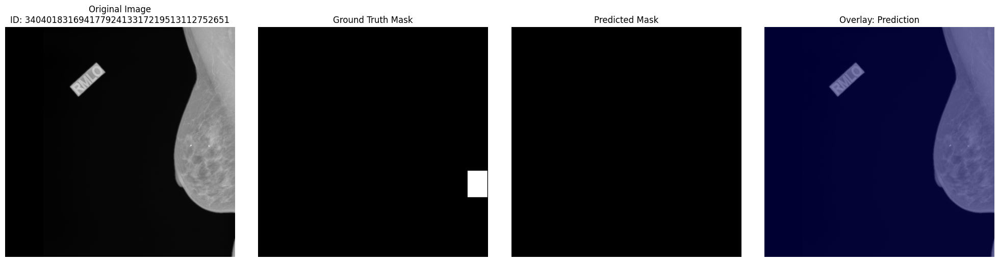


🔍 Visualizing cancer test image 4 / 1493
📄 Image ID: 188431504890332779594478174236545773866
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


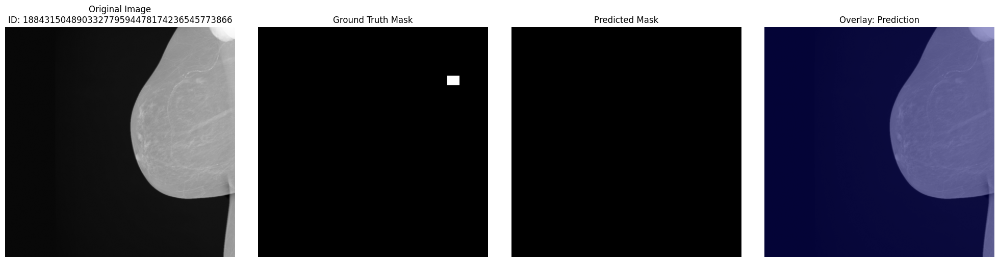


🔍 Visualizing cancer test image 5 / 1493
📄 Image ID: 9379550621708863389677068077026169677
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


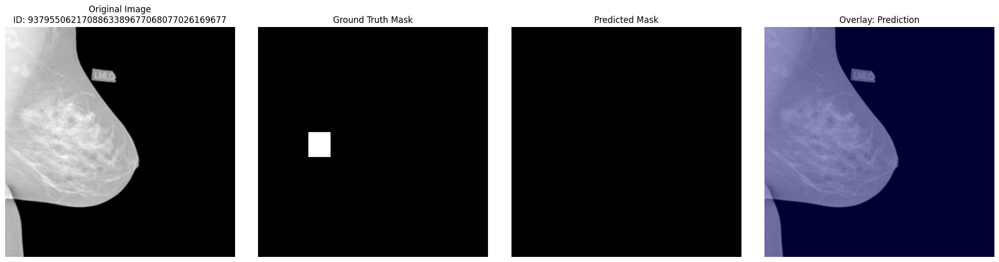


🔍 Visualizing cancer test image 6 / 1493
📄 Image ID: 179300338433869394816120106210330359316
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


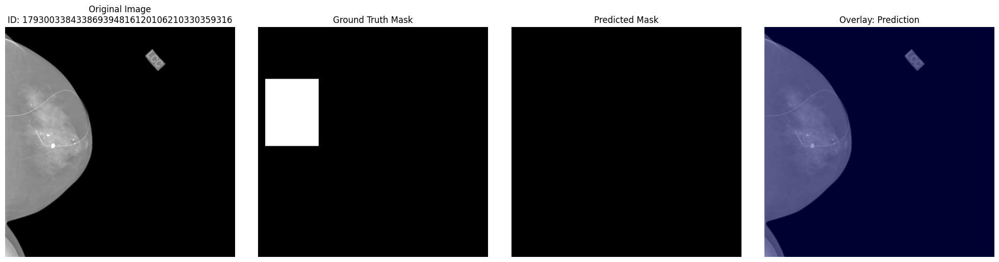


🔍 Visualizing cancer test image 7 / 1493
📄 Image ID: 258788288305843624439391873508626749255
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


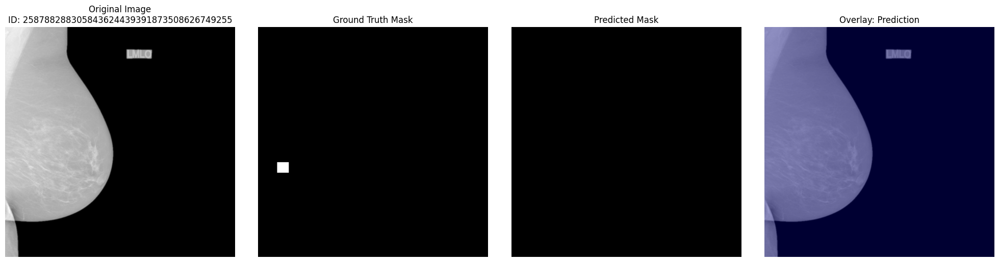


🔍 Visualizing cancer test image 8 / 1493
📄 Image ID: 125586071750700918656146156319074457724
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


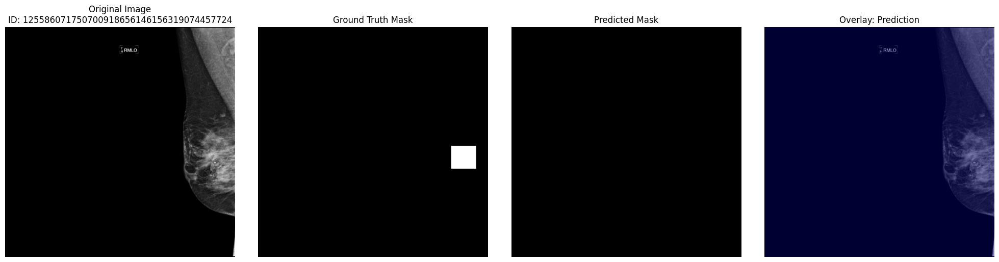


🔍 Visualizing cancer test image 9 / 1493
📄 Image ID: 332083348977456476136634586771685755743
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


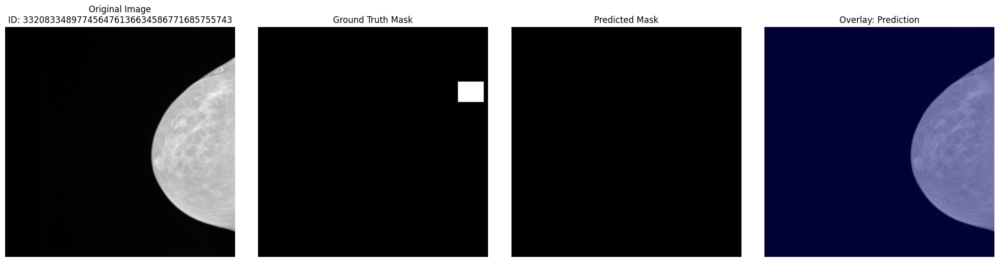


🔍 Visualizing cancer test image 10 / 1493
📄 Image ID: 8838293337960229642936511826006408322
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


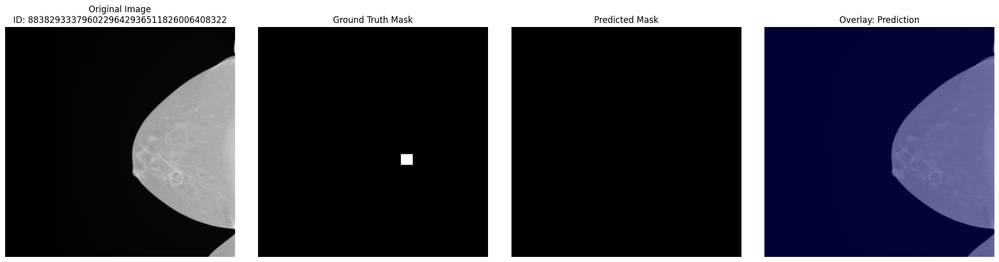


🔍 Visualizing cancer test image 11 / 1493
📄 Image ID: 196374148283700303044884804249736064372
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


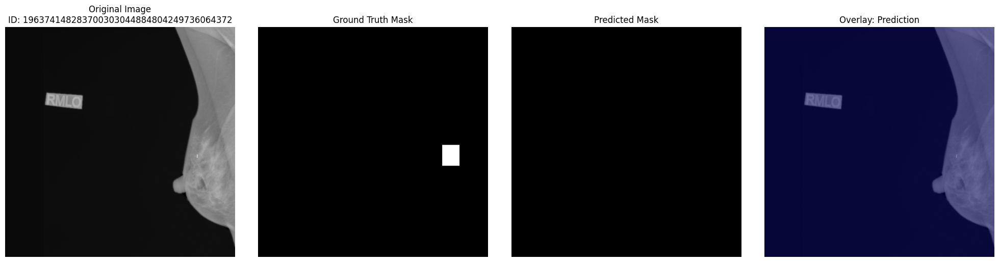


🔍 Visualizing cancer test image 12 / 1493
📄 Image ID: 170509228177400704408723451047204714676
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


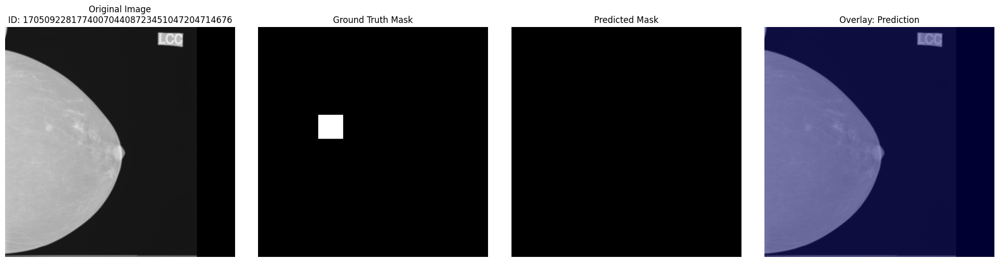


🔍 Visualizing cancer test image 13 / 1493
📄 Image ID: 73322619488166671978514006548477233354
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


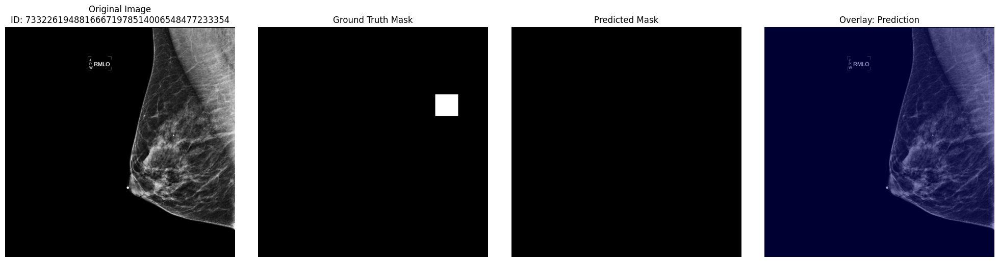


🔍 Visualizing cancer test image 14 / 1493
📄 Image ID: 332538402342663148029890653589002906263
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


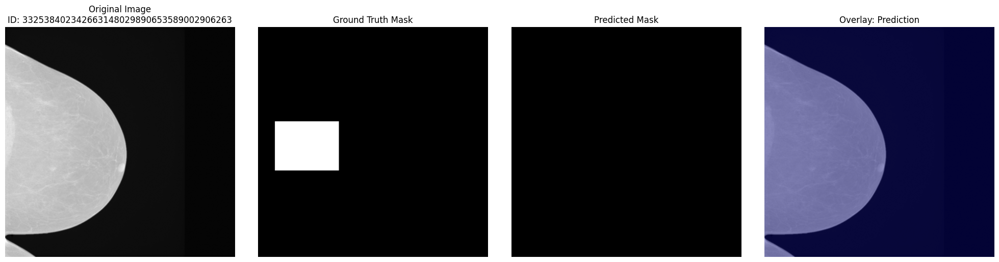


🔍 Visualizing cancer test image 15 / 1493
📄 Image ID: 196603479605469914870007136261860522977
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


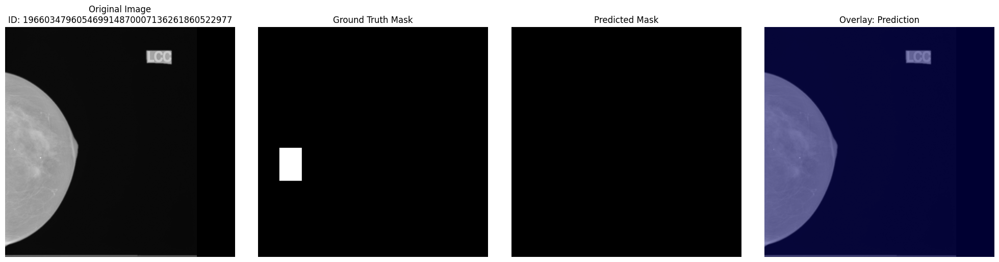


🔍 Visualizing cancer test image 16 / 1493
📄 Image ID: 110428770184215964828978478839427516702
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


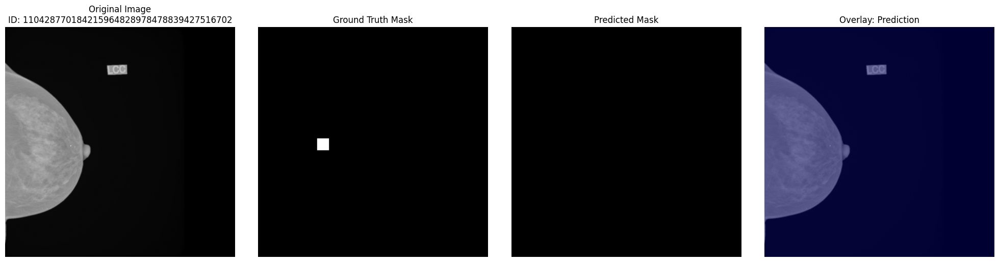


🔍 Visualizing cancer test image 17 / 1493
📄 Image ID: 317779794272860975022319948587637296808
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


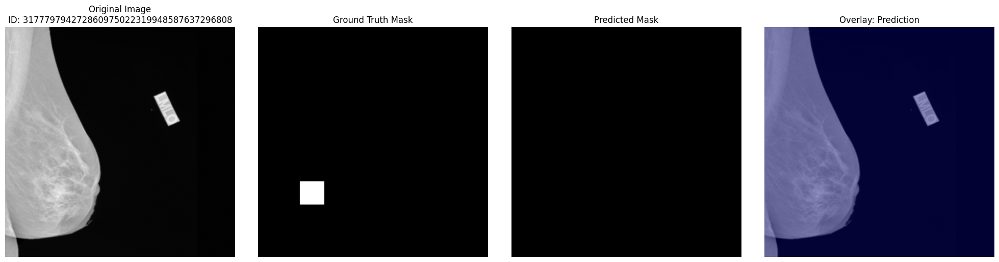


🔍 Visualizing cancer test image 18 / 1493
📄 Image ID: 241138288103578165372708583964764453364
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


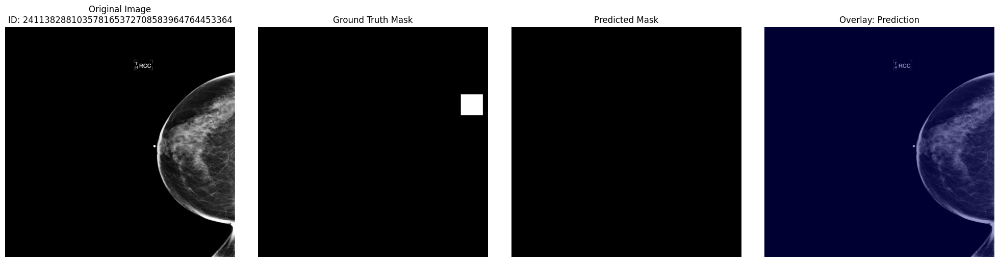


🔍 Visualizing cancer test image 19 / 1493
📄 Image ID: 75532677474370727626388275437296441383
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


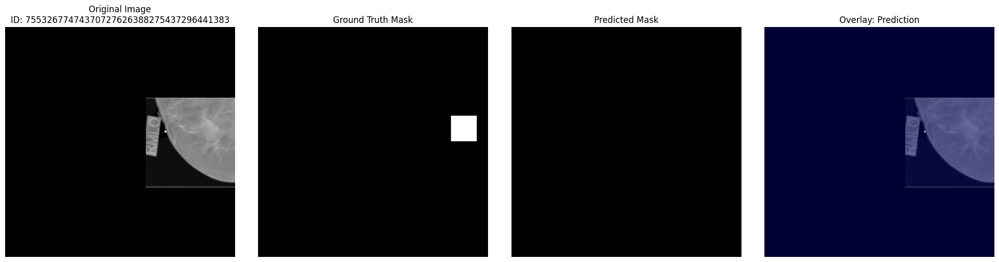


🔍 Visualizing cancer test image 20 / 1493
📄 Image ID: 339025943227091195470489699437755497396
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


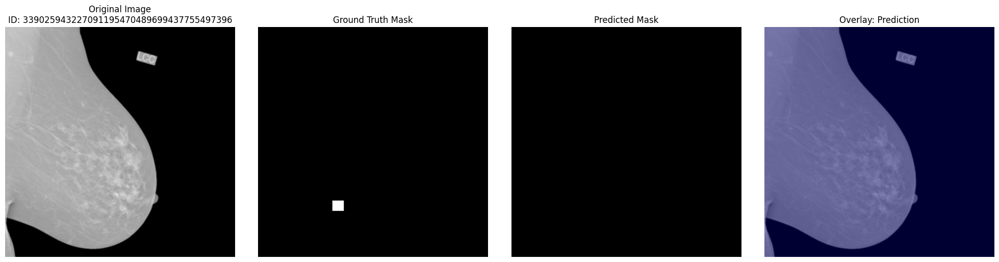


🔍 Visualizing cancer test image 21 / 1493
📄 Image ID: 104204549828612605278377040371771424685
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


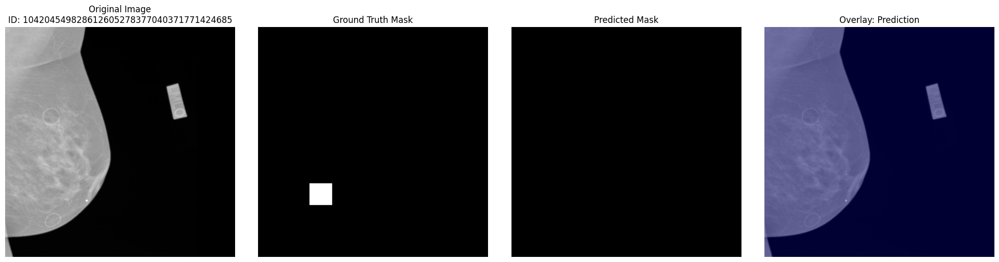


🔍 Visualizing cancer test image 22 / 1493
📄 Image ID: 138646777537353296259637733681565947425
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


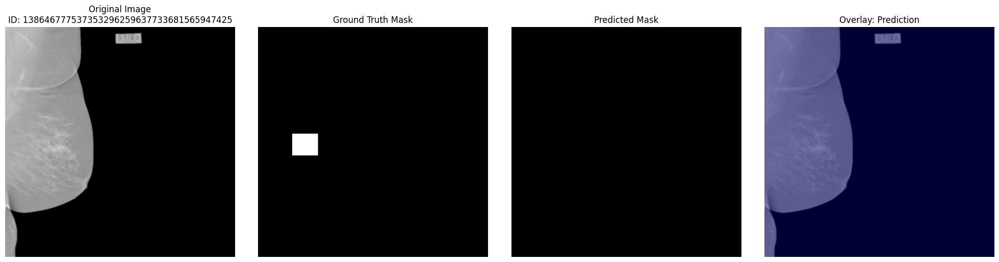


🔍 Visualizing cancer test image 23 / 1493
📄 Image ID: 221456621875241236809606140884620525847
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


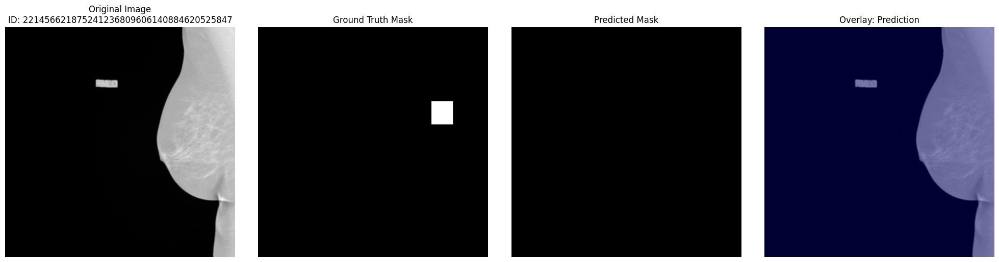


🔍 Visualizing cancer test image 24 / 1493
📄 Image ID: 249687950416858804989656643689171840036
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


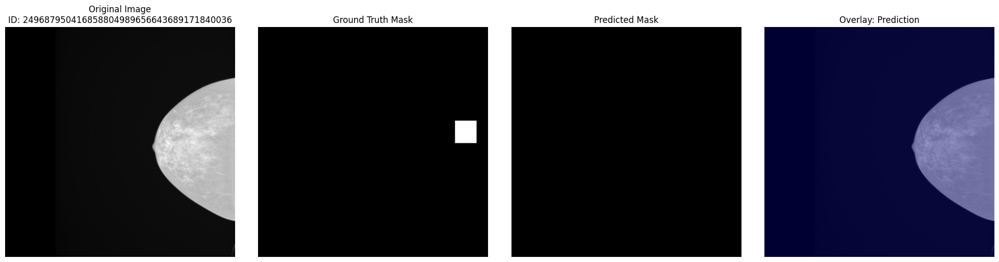


🔍 Visualizing cancer test image 25 / 1493
📄 Image ID: 78303389040553721281510685086236437303
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


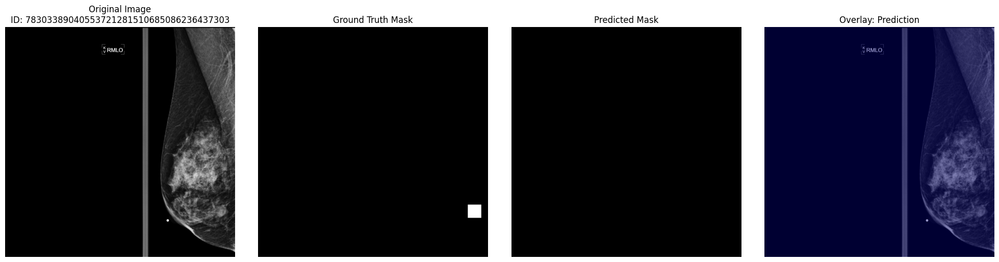


🔍 Visualizing cancer test image 26 / 1493
📄 Image ID: 219785464800077842587282905594776475606
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


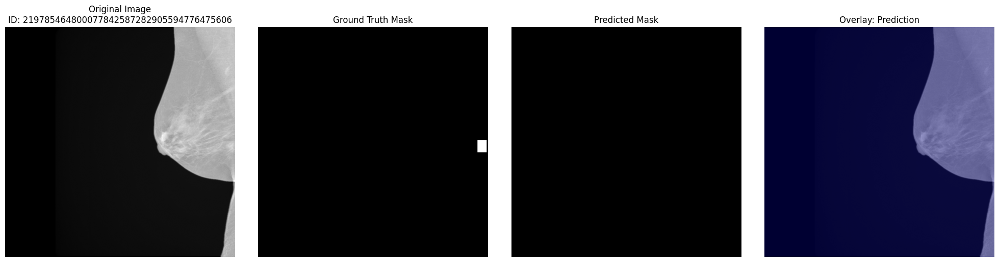


🔍 Visualizing cancer test image 27 / 1493
📄 Image ID: 80861278897977559766143713086493469081
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


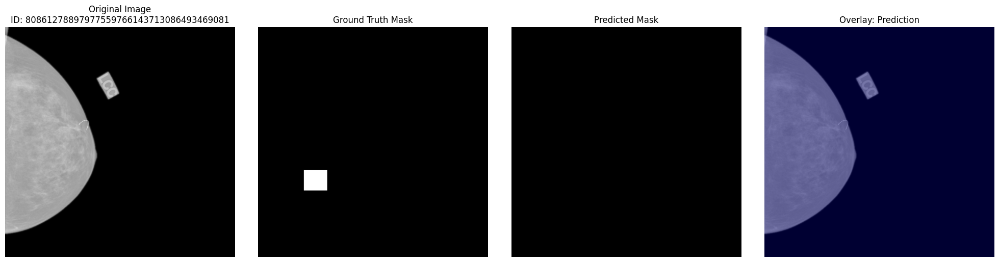


🔍 Visualizing cancer test image 28 / 1493
📄 Image ID: 307899252999129137044444342396539288693
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


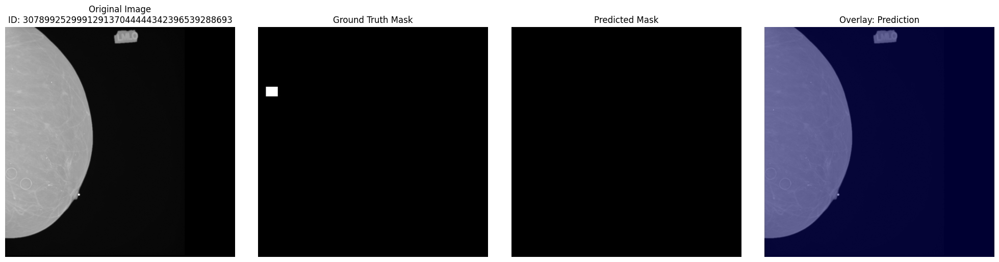


🔍 Visualizing cancer test image 29 / 1493
📄 Image ID: 320690985174626298872943042839987238070
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


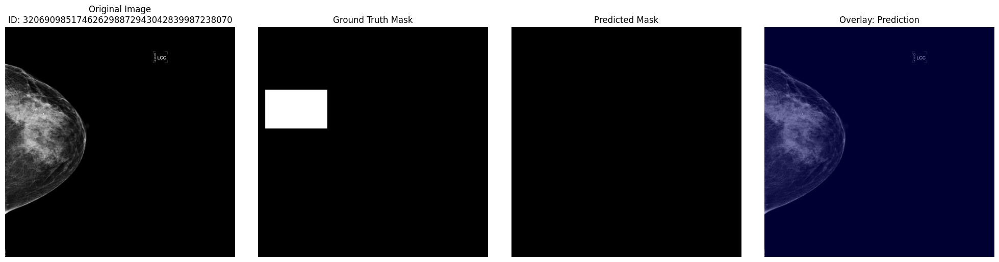


🔍 Visualizing cancer test image 30 / 1493
📄 Image ID: 157888572249550666227793925755153904863
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


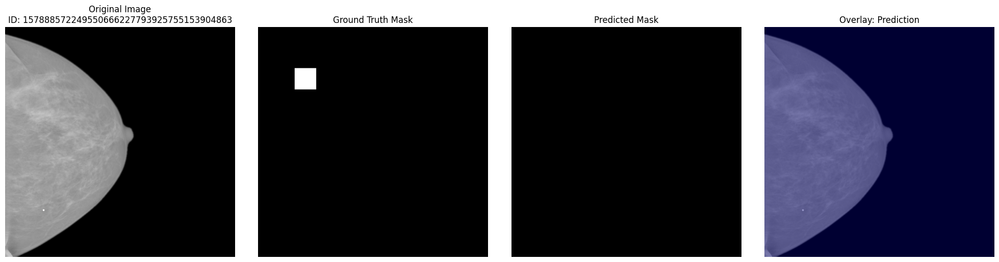

In [18]:
# Get only the test IDs
test_ids = set([f.replace(".npz", "") for f in os.listdir(IMG_DIR) if f.endswith(".npz")])

# Filter cancer_ids to only those in test set
cancer_test_ids = [img_id for img_id in cancer_ids if img_id in test_ids]

print(f"✅ Found {len(cancer_test_ids)} cancer-positive images in the test set.")

# Visualize first 30 cancer-positive test images
for i in range(min(30, len(cancer_test_ids))):
    print(f"\n🔍 Visualizing cancer test image {i+1} / {len(cancer_test_ids)}")
    print(f"📄 Image ID: {cancer_test_ids[i]}")
    visualize_prediction(cancer_test_ids[i])


In [17]:
# Visualize the first 30 cancer-positive images (if available)
for i in range(min(30, len(cancer_ids))):
    print(f"\n🔍 Visualizing cancer image {i+1} / {len(cancer_ids)}")
    print(f"📄 Image ID: {cancer_ids[i]}")
    visualize_prediction(cancer_ids[i])



🔍 Visualizing cancer image 1 / 7351
📄 Image ID: 227670955645247820376970241554089534780


FileNotFoundError: [Errno 2] No such file or directory: '/raid/mpsych/OMAMA/2025/PLAYGROUND/cancer_classifier_1024/split/test/images/227670955645247820376970241554089534780.npz'